<div>
<a href="http://www.music-processing.de/"><img style="float:left;" src="../data/FMP_Teaser_Cover.png" width=40% alt="FMP"></a>
<a href="https://www.audiolabs-erlangen.de"><img src="../data/Logo_AudioLabs_Long.png" width=59% style="float: right;" alt="AudioLabs"></a>
</div>

<div>
<a href="../C6/C6.html"><img src="../data/C6_nav.png" width="100"  style="float:right;" alt="C6"></a>
<h1>Predominant Local Pulse (PLP)</h1> 
</div>

<br/>

<p>
Following Section 6.3.1 of <a href="http://www.music-processing.de/">[Müller, FMP, Springer 2015]</a>, we introduce in this notebook an algorithm to compute predominant local pulse (PLP). This concept was first described by Grosche and Müller. A MATLAB implementation can be found in the  <a href="https://www.audiolabs-erlangen.de/resources/MIR/tempogramtoolbox">Tempogram Toolbox</a>. An application and analysis of the PLP technique within a challenging music scenario can found in the article on <a href="https://www.audiolabs-erlangen.de/fau/professor/mueller/publications/2010_GroscheMuellerSapp_BeatError_ISMIR.pdf">"What makes beat tracking difficult?"</a>

<ul>
<li><span style="color:black">
Peter Grosche and Meinard Müller: <a href="https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=5654580"><strong>Extracting Predominant Local Pulse Information from Music Recordings.</strong></a> IEEE Transactions on Audio, Speech, and Language Processing, 19(6): 1688–1701, 2011. 
<br>
<a type="button" class="btn btn-default btn-xs" target="_blank" href="../data/bibtex/FMP_bibtex_GroscheM11_PLP_TASLP.txt"> Bibtex </a>
</span></li>
    
<li><span style="color:black">
Peter Grosche and Meinard Müller: <a href="https://www.audiolabs-erlangen.de/fau/professor/mueller/publications/2009_GroscheMueller_Tempogram_ISMIR.pdf"><strong>A mid-level representation for capturing dominant tempo and pulse information in music recordings.</strong></a>  Proceedings of the International Society for Music Information Retrieval Conference (ISMIR): 189&ndash;194, 2009. 
<br>
<a type="button" class="btn btn-default btn-xs" target="_blank" href="../data/bibtex/FMP_bibtex_GroscheM09_Tempogram_ISMIR.txt"> Bibtex </a>
</span></li>
    
<li><span style="color:black">
Peter Grosche and Meinard Müller: <a href="https://www.audiolabs-erlangen.de/fau/professor/mueller/publications/2011_GroscheMueller_TempogramToolbox_ISMIR-LateBreaking.pdf"><strong>Tempogram Toolbox: MATLAB implementations for tempo and pulse analysis of music recordings.</strong></a> Late-Breaking and Demo Session of the International Conference on Music Information Retrieval (ISMIR), Miami, USA, 2011. 
<br>
 <a href="https://www.audiolabs-erlangen.de/resources/MIR/tempogramtoolbox">Website of the Tempogram Toolbox.</a>    
<br>
<a type="button" class="btn btn-default btn-xs" target="_blank" href="../data/bibtex/FMP_bibtex_GroscheM11_TempogramToolbox_ISMIR-lateBreaking.txt"> Bibtex </a>
</span></li>

<li><span style="color:black">
Peter Grosche, Meinard Müller, Craig Stuart Sapp: <a href="https://www.audiolabs-erlangen.de/fau/professor/mueller/publications/2010_GroscheMuellerSapp_BeatError_ISMIR.pdf"><strong>What makes beat tracking difficult? A case study on Chopin Mazurkas.</strong></a>  Proceedings of the International Conference on Music Information Retrieval (ISMIR): 649&ndash;654, 2010.  
<br>
<a type="button" class="btn btn-default btn-xs" target="_blank" href="../data/bibtex/FMP_bibtex_GroscheMS10_BeatTrackingErrors_ISMIR.txt"> Bibtex </a>
</span></li>
</ul>    
</p> 

## Main Idea

The task of beat and pulse tracking can be seen as an extension of tempo estimation in the sense that, additionally to the rate, it also considers the phase of the pulses. The idea of the <a href="../C6/C6S2_TempogramFourier.html">Fourier Tempogram</a> was to locally compare a given novelty curve with windowed sinusoids. Based on this idea, we determine for each time position a windowed sinusoid that best captures the local peak structure of the novelty function. Instead of looking at the windowed sinusoids individually, the crucial idea is to employ an overlap-add technique by accumulating all sinusoids over time. As a result, one obtains a single function that can be regarded as a local periodicity enhancement of the original novelty function. Revealing **predominant local pulse** (PLP) information, this representation is referred to as a **PLP function**. In this context, we use the term **predominant pulse** in a rather loose way to refer to the strongest pulse level that is measurable in the underlying novelty function. Intuitively, the PLP function can be regarded as a pulse tracker that can adjust to continuous and sudden changes in tempo as long as the underlying novelty function possesses locally periodic patterns. 

## Optimal Windowed Sinusoids

Given a novelty function $\Delta:\mathbb{Z}\to\mathbb{R}$, we derived the [Fourier tempogram](../C6/C6S2_TempogramFourier.html) (see also Section 6.2.2 of <a href="http://www.music-processing.de/">[Müller, FMP, Springer 2015]</a>) from the complex Fourier coefficient $\mathcal{F}(n,\omega)$ defined by 

\begin{equation}
    \mathcal{F}(n,\omega) = \sum_{m\in\mathbb{Z}} \Delta(m)\overline{w}(m-n)\mathrm{exp}(-2\pi i\omega m).
\end{equation}

From this, we obtained the Fourier tempogram by setting

\begin{equation}
	\mathcal{T}^\mathrm{F}(n,\tau) = |\mathcal{F}(n,\tau/60)|.
\end{equation}

For each time position $n\in\mathbb{Z}$, we now consider the tempo parameter $\tau_n\in \Theta$ that maximizes $\mathcal{T}^\mathrm{F}(n,\tau)$:

\begin{equation}
	\tau_n := \underset{\tau\in\Theta}{\mathrm{argmax}} \mathcal{T}^\mathrm{F}(n,\tau).
\end{equation}

The **phase information** encoded by the complex Fourier coefficient $\mathcal{F}(n,\omega)$ can be used to derive the phase $\varphi_n$ of the windowed sinusoid of tempo $\tau_n$ that best correlates with the local section around $n$ of the novelty function $\Delta$. Following the [FMP notebook on the DFT phase](../C2/C2_DFT-Phase.html) (see also Section 2.3.2.4 of <a href="http://www.music-processing.de/">[Müller, FMP, Springer 2015]</a>), the phase is given by

\begin{equation}
	\varphi_n = - \frac{1}{2\pi} \mathrm{angle}\big( \mathcal{F}(n,\tau_n/60) \big),
\end{equation}

where the angle of a complex number is given in radians (a number in $[0,2\pi)$). Based on $\tau_n$ and $\varphi_n$, we define the **optimal windowed sinusoid** $\kappa_n:\mathbb{Z}\to \mathbb{R}$ by setting 

\begin{equation}
	\kappa_n(m) := w(m-n) \cos\Big(2\pi \big((\tau_n/60)\cdot m  - \varphi_n\big)\Big)
\end{equation}

for each time point $n\in\mathbb{Z}$, where we use the same window function $w$ as for the Fourier tempogram. Intuitively, the sinusoid $\kappa_n$ best explains the local periodic nature of the novelty function at time position $n$ with respect to the tempo set $\Theta$. The period $60/\tau_n$ corresponds to the predominant periodicity of
the novelty function, and the phase information $\varphi_n$ takes care of accurately aligning the maxima of $\kappa_n$ and the peaks of the novelty function. The relevance of the sinusoids $\kappa_n$ depends not only on the quality of the novelty function, but also on the window size of $w$ and the tempo set $\Theta$. 

## Example: Shostakovich

As an example, we use again the Shostakovich excerpt of an orchestra recording of the Waltz No. 2. As described in the [FMP notebook on novelty functions](../C6/C6S1_NoveltyComparison.html),  the first beats (downbeats) of the $3/4$ meter are weak, whereas the second and third beats are strong. 

<img src="../data/C6/FMP_C6_F07_Shostakovich_Waltz-02-Section_Score.png" width="500px" align="left" alt="FMP_C6_F07_Shostakovich_Waltz-02-Section_Score.png">

<br clear="all" />

<audio style="width: 700px;" src="../data/C6/FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.mp3" type="audio/mpeg" controls="controls"></audio>

Continuing the explanations from the [FMP notebook on the Fourier tempogram](../C6/C6S2_TempogramFourier.html), we show in the next figure a Fourier-based tempogram for the Shostakovich recording. Furthermore, we show optimal sinusoidal kernels plotted on top of the underlying novelty functions for various time-tempo pairs indicated as red points in the tempogram visualization.

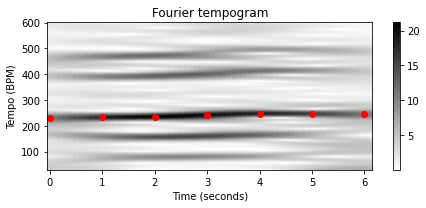

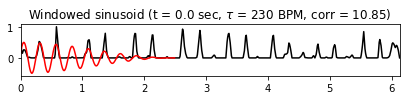

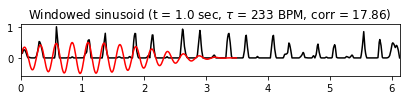

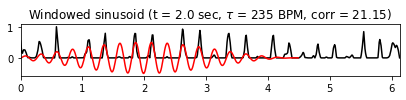

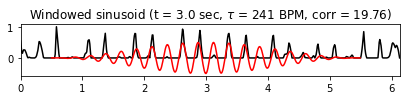

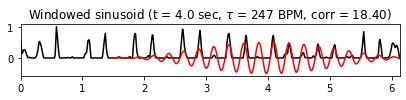

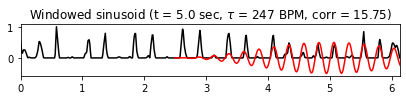

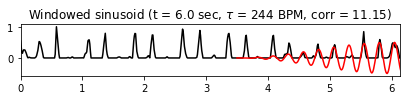

In [1]:
import os
import sys
import numpy as np
from numba import jit
import librosa
from scipy import signal
from scipy.interpolate import interp1d
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
import IPython.display as ipd

sys.path.append('..')
import libfmp.b
import libfmp.c2
import libfmp.c6

%matplotlib inline

fn_wav = os.path.join('..', 'data', 'C6', 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.wav')
Fs = 22050
x, Fs = librosa.load(fn_wav, Fs) 

nov, Fs_nov = libfmp.c6.compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, 
                                                 gamma=100, M=10, norm=True)
nov, Fs_nov = libfmp.c6.resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

N = 500 #corresponding to 5 seconds (Fs_nov = 100 Hz)
H = 10  #Hopsize leading to a tempogram resolution of 10 Hz
Theta = np.arange(30, 601) #Tempo range parameter
X, T_coef, F_coef_BPM = libfmp.c6.compute_tempogram_fourier(nov, Fs=Fs_nov, N=N, H=H, 
                                                            Theta=Theta)
tempogram = np.abs(X)

t_nov = np.arange(nov.shape[0]) / Fs_nov
coef_n = np.array([0, 10, 20, 30, 40, 50, 60])
coef_k = np.zeros(len(coef_n), dtype=int)

for i in range(len(coef_n)):
    coef_k[i] = np.argmax(tempogram[:,coef_n[i]])

fig, ax, im = libfmp.b.plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, 
                                   figsize=(6.5, 3), ylabel='Tempo (BPM)',
                                   title='Fourier tempogram')
ax[0].plot(T_coef[coef_n], F_coef_BPM[coef_k], 'ro')

for i in range(len(coef_n)):
    n = coef_n[i]
    k = coef_k[i]
    tempo = F_coef_BPM[k]
    time = T_coef[n]
    corr = np.abs(X[k,n])
    kernel, t_kernel, t_kernel_sec = libfmp.c6.compute_sinusoid_optimal(X[k,n], 
                                            F_coef_BPM[k], n, Fs_nov, N, H)
    title=r'Windowed sinusoid (t = %0.1f sec, $\tau$ = %0.0f BPM, corr = %0.2f)'% (time, tempo, corr)
    libfmp.c6.plot_signal_kernel(nov, t_nov, 0.5*kernel, t_kernel_sec, 
                                 figsize=(6, 1.5), title=title)     

## Definition of PLP Function 

The estimation of optimal windowed sinusoids in regions with a strongly corrupt peak structure is problematic. This particularly holds in the case of small window sizes. To make the periodicity estimation more robust while keeping the temporal flexibility, the idea is to form a single function instead of looking at the sinusoids in a one-by-one fashion. To this end, we apply an **overlap&ndash;add** technique, where the optimal windowed sinusoids $\kappa_n$ are accumulated over all time positions $n\in\mathbb{Z}$. Furthermore, we only consider the positive part of the resulting function. More precisely, we define a function $\Gamma:\mathbb{Z}\to\mathbb{R}_{\geq 0}$ as follows:

\begin{equation}
    \Gamma(m) =\big|\textstyle \sum_{n\in \mathbb{Z}}  \kappa_n(m)\big|_{\geq 0}
\end{equation}

for $n\in\mathbb{Z}$, where we use the half-wave rectification. The resulting function is our mid-level representation referred to as **PLP function** (indicating the predominant local pulse). Continuing our Shostakovich example, we illustrate the steps of the PLP computation by showing the following plots:

* Novelty curve.
* Fourier tempogram with frame-wise maxima (shown for only seven time positions $n$ for visualization purposes).
* Optimal windowed sinusoids $\kappa_n$ using a window size of $5$ seconds (shown for only seven positions).
* Accumulation of optimal sinusoids over all time frames (overlap-add).
* Resulting PLP function $\Gamma$ obtained after half-wave rectification.


<!--<img src="../data/C6/FMP_C6_F18.png" width="320px" align="middle" alt="FMP_C6_F18">-->

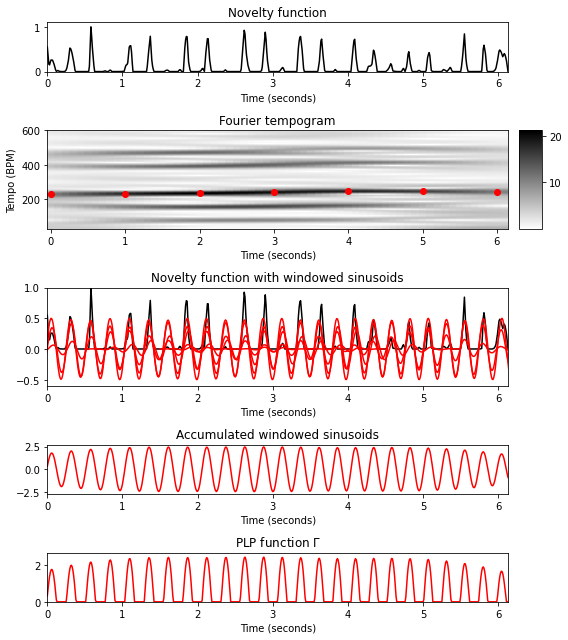

In [2]:
L = nov.shape[0]
N_left = N // 2
L_left = N_left
L_right = N_left
L_pad = L + L_left + L_right
t_pad = np.arange(L_pad)

t_nov = np.arange(nov.shape[0]) / Fs_nov
coef_n = np.array([0, 10, 20, 30, 40, 50, 60])
coef_k = np.zeros(len(coef_n), dtype=int)

for i in range(len(coef_n)):
    coef_k[i] = np.argmax(tempogram[:, coef_n[i]])

fig, ax = plt.subplots(5, 2, gridspec_kw={'width_ratios': [1, 0.05], 
                                          'height_ratios': [1, 2, 2, 1, 1]}, figsize=(8, 9))        

libfmp.b.plot_signal(nov, Fs_nov, ax=ax[0, 0], color='k', title='Novelty function')
ax[0, 1].set_axis_off()

libfmp.b.plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, ax=[ax[1,0], ax[1,1]], 
                     title='Fourier tempogram', ylabel='Tempo (BPM)', colorbar=True)
ax[1, 0].plot(T_coef[coef_n], F_coef_BPM[coef_k], 'ro')

libfmp.b.plot_signal(nov, Fs_nov, ax=ax[2, 0], color='k', title='Novelty function with windowed sinusoids')
ax[2, 1].set_axis_off()

nov_PLP = np.zeros(L_pad)
for i in range(len(coef_n)):
    n = coef_n[i]
    k = coef_k[i]
    tempo = F_coef_BPM[k]
    time = T_coef[n]
    kernel, t_kernel, t_kernel_sec = libfmp.c6.compute_sinusoid_optimal(X[k, n], F_coef_BPM[k], n, Fs_nov, N, H)    
    nov_PLP[t_kernel] = nov_PLP[t_kernel] + kernel
    ax[2, 0].plot(t_kernel_sec, 0.5 * kernel, 'r')
    ax[2, 0].set_ylim([-0.6, 1])
    
nov_PLP = nov_PLP[L_left:L_pad-L_right]
libfmp.b.plot_signal(nov_PLP, Fs_nov, ax=ax[3, 0], color='r', title='Accumulated windowed sinusoids')
ax[3,1].set_axis_off()

nov_PLP[nov_PLP < 0] = 0
libfmp.b.plot_signal(nov_PLP, Fs_nov, ax=ax[4, 0], color='r', title='PLP function $\Gamma$')
ax[4, 1].set_axis_off()

plt.tight_layout()

Note how the maxima of the different windowed sinusoids align well not only with the peaks of the novelty function, but also with the maxima of neighboring sinusoids in the overlapping regions, which leads to [**constructive interferences**](../C2/C2S3_InterferenceBeating.html). As indicated by the Fourier tempogram, the dominant tempo lies between $200$ and $250~\mathrm{BPM}$ throughout this excerpt with a slight tempo increase starting with roughly $\tau=225~\mathrm{BPM}$. The maximizing tempo values as well as the corresponding optimal windowed sinusoids are indicated for seven different time positions. Note that each of these windowed sinusoids tries to explain the locally periodic nature of the peak structure of the novelty function, where small deviations from the "ideal" periodicity and weak peaks are balanced out. Furthermore, note that the predominant pulse positions are clearly indicated by the peaks of $\Gamma$ even though some of these pulse positions are rather weak in the original novelty function. In this sense, the PLP function can be regarded as a **local periodicity enhancement** of the original novelty function, where the predominant pulse level is taken into account. 

In the following code cell, we define a function that takes as input the complex-valued Fourier tempogram  and outputs a PLP function, where the optimal windowed sinusoids $\kappa_n$  are accumulated over all tempogram frames $n$. The visualization shows the original novelty function as well as the resulting PLP function along with peaks obtained by some [**peak-picking strategy**](../C6/C6S1_PeakPicking.html). Furthermore, a **peak sonification** via a click track added to the original audio recording generated.

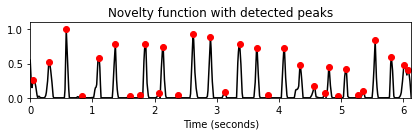

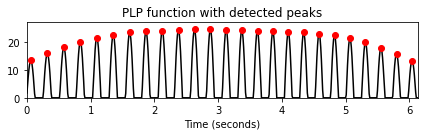

In [3]:
@jit(nopython=True)
def compute_plp(X, Fs, L, N, H, Theta):
    """Compute windowed sinusoid with optimal phase

    Notebook: C6/C6S3_PredominantLocalPulse.ipynb

    Args:
        X (np.ndarray): Fourier-based (complex-valued) tempogram
        Fs (scalar): Sampling rate
        L (int): Length of novelty curve
        N (int): Window length
        H (int): Hop size
        Theta (np.ndarray): Set of tempi (given in BPM)

    Returns:
        nov_PLP (np.ndarray): PLP function
    """
    win = np.hanning(N)
    N_left = N // 2
    L_left = N_left
    L_right = N_left
    L_pad = L + L_left + L_right
    nov_PLP = np.zeros(L_pad)
    M = X.shape[1]
    tempogram = np.abs(X)
    for n in range(M):
        k = np.argmax(tempogram[:, n])
        tempo = Theta[k]
        omega = (tempo / 60) / Fs
        c = X[k, n]
        phase = - np.angle(c) / (2 * np.pi)
        t_0 = n * H
        t_1 = t_0 + N
        t_kernel = np.arange(t_0, t_1)
        kernel = win * np.cos(2 * np.pi * (t_kernel * omega - phase))
        nov_PLP[t_kernel] = nov_PLP[t_kernel] + kernel
    nov_PLP = nov_PLP[L_left:L_pad-L_right]
    nov_PLP[nov_PLP < 0] = 0
    return nov_PLP

fn_wav = os.path.join('..', 'data', 'C6', 'FMP_C6_F07_Shostakovich_Waltz-02-Section_IncreasingTempo.wav')
Fs = 22050
x, Fs = librosa.load(fn_wav, Fs) 

nov, Fs_nov = libfmp.c6.compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, 
                                                 gamma=100, M=10, norm=True)
nov, Fs_nov = libfmp.c6.resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

L = len(nov)
N = 500
H = 10
Theta = np.arange(30, 601)
X, T_coef, F_coef_BPM = libfmp.c6.compute_tempogram_fourier(nov, Fs=Fs_nov, N=N, H=H, 
                                                            Theta=Theta)
nov_PLP = compute_plp(X, Fs_nov, L, N, H, Theta)

t_nov = np.arange(nov.shape[0]) / Fs_nov
peaks, properties = signal.find_peaks(nov, prominence=0.02)
peaks_sec = t_nov[peaks]
libfmp.b.plot_signal(nov, Fs_nov, color='k', title='Novelty function with detected peaks');
plt.plot(peaks_sec, nov[peaks], 'ro')
plt.show()
x_peaks = librosa.clicks(peaks_sec, sr=Fs, click_freq=1000, length=len(x))
ipd.display(ipd.Audio(x + x_peaks, rate=Fs))

peaks, properties = signal.find_peaks(nov_PLP, prominence=0.02)
peaks_sec = t_nov[peaks]
libfmp.b.plot_signal(nov_PLP, Fs_nov, color='k', title='PLP function with detected peaks');
plt.plot(peaks_sec, nov_PLP[peaks], 'ro')
plt.show()
x_peaks = librosa.clicks(peaks_sec, sr=Fs, click_freq=1000, length=len(x))
ipd.display(ipd.Audio(x + x_peaks, rate=Fs))

## Example: Brahms

As a second example, we consider an orchestra recording of the Hungarian Dance No. 5 by Johannes Brahms. In the following, we only consider a small audio excerpt (the section between $t_1=35~\mathrm{sec}$ and $t_2=53~\mathrm{sec}$ of the recording), where measures $26$ to $38$ are played. With respect to the overall **musical structure** $A_1A_2B_1B_2CA_3B_3B_4D$ of the recording, the excerpt comprises the transition from the $A_2$-section to the $B_1$-section.

<img src="../data/C6/FMP_C6_F19a.png" width="700px" align="left" alt="FMP_C6_F19a.png">

<br clear="all" />

<audio src="../data/C6/FMP_C6_F19_Brahms_Ormandy_sec35-53.mp3" type="audio/mpeg" controls="controls"></audio>

Because of  significant local tempo changes, this recording constitutes a great challenge for tempo estimation and pulse tracking. Considering a quarter-note pulse level, a manual inspection shows that the excerpt

* starts with a tempo of $90~\mathrm{BPM}$ (measures $26$&ndash;$28$, seconds $35$&ndash;$39$), 
* then abruptly changes to $140~\mathrm{BPM}$ (measures $29$&ndash;$32$, seconds $39$&ndash;$41$), 
* and continues with $75~\mathrm{BPM}$ (measures $33$&ndash;$38$, seconds $41$&ndash;$53$). 

Many of the note onsets are poorly captured by the novelty function. Furthermore, because of large differences in dynamics, there are some strong onsets that dominate the novelty function as well as some weak onsets that can hardly be distinguished from spurious peaks not related to any note onsets. As a result, the height of a peak is not necessarily the only indicator of its relevance. Despite these challenges, the tempo is reflected well by the Fourier tempogram on the eighth-note pulse level (the second harmonic of the quarter-note tempo). Although corrupt, the peak structure of the novelty function still possesses some local periodic regularities, which are captured by the windowed sinusoids corresponding to the predominant local tempo. The resulting  PLP function $\Gamma$ is capable of revealing the pulse positions on the eighth-note level.

<!--<img src="../data/C6/FMP_C6_F19_text.png" width="600px" align="middle" alt="FMP_C6_F19_text.png">-->

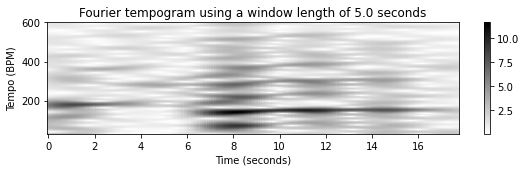

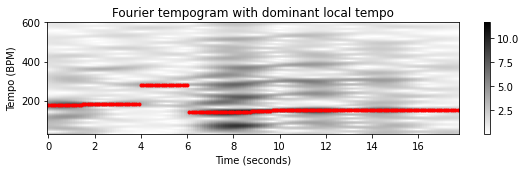

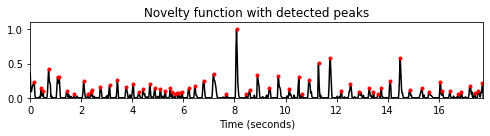

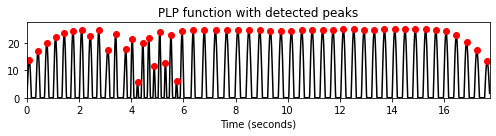

In [4]:
fn_wav = os.path.join('..', 'data', 'C6', 'FMP_C6_F19_Brahms_Ormandy_sec35-53.wav')
Fs = 22050
x, Fs = librosa.load(fn_wav, Fs) 

nov, Fs_nov = libfmp.c6.compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, 
                                                 gamma=100, M=10, norm=True)
nov, Fs_nov = libfmp.c6.resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

N = 500
H = 10
Theta = np.arange(30, 601)
L = len(nov)
X, T_coef, F_coef_BPM = libfmp.c6.compute_tempogram_fourier(nov, Fs=Fs_nov, N=N, H=H, 
                                                            Theta=Theta)
nov_PLP = compute_plp(X, Fs_nov, L, N, H, Theta)

tempogram = np.abs(X)
title = 'Fourier tempogram using a window length of %0.1f seconds'%(N/Fs_nov)
libfmp.b.plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, figsize=(8,2.5),
                     title=title, ylabel='Tempo (BPM)', colorbar=True);
fig, ax, im = libfmp.b.plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, 
                                   figsize=(8,2.5), ylabel='Tempo (BPM)', colorbar=True,
                                   title='Fourier tempogram with dominant local tempo') 
coef_k = np.argmax(tempogram, axis=0)
ax[0].plot(T_coef, F_coef_BPM[coef_k], 'r.')

t_nov = np.arange(nov.shape[0]) / Fs_nov
peaks, properties = signal.find_peaks(nov, prominence=0.05)
peaks_sec = t_nov[peaks]
libfmp.b.plot_signal(nov, Fs_nov, color='k', figsize=(7,2),
                     title='Novelty function with detected peaks');
plt.plot(peaks_sec, nov[peaks], 'r.')
plt.show()
x_peaks = librosa.clicks(peaks_sec, sr=Fs, click_freq=1000, length=len(x))
ipd.display(ipd.Audio(x + x_peaks, rate=Fs))

peaks, properties = signal.find_peaks(nov_PLP, prominence=0.05)
peaks_sec = t_nov[peaks]
libfmp.b.plot_signal(nov_PLP, Fs_nov, color='k', figsize=(7,2),
                     title='PLP function with detected peaks');
plt.plot(peaks_sec, nov_PLP[peaks], 'ro')
plt.show()
x_peaks = librosa.clicks(peaks_sec, sr=Fs, click_freq=1000, length=len(x))
ipd.display(ipd.Audio(x + x_peaks, rate=Fs))

## Dependency of Sinusoid Window Length  

When computing a PLP function, there are many parameters involved. First of all, the final result depends on input [novelty curve](../C6/C6S1_NoveltyComparison.html), which can be computed in many different ways. In this notebook, we have a closer look at the length of the windowed sinusoids used to compute the Fourier tempogram. Obviously, one has a trade-off between contradicting principles. Using longer windows, one obtains more accurate and robust tempo estimates, but looses temporal flexibility. In contrast, using shorter windows one increases the temporal resolution, but makes the tempo estimates more vulnerable. We demonstrate this trade-off by continuing our Brahms example. In the first, case we use a  window length corresponding to 12 seconds, while in the second case the window length is only 2 seconds.

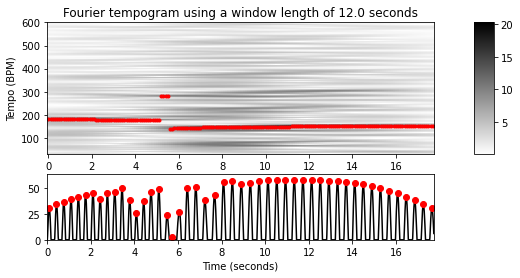

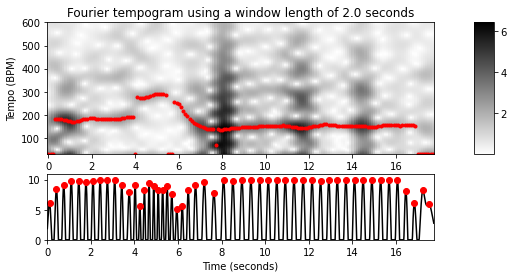

In [5]:
def compute_plot_tempogram_plp(fn_wav, Fs=22050, N=500, H=10, Theta=np.arange(30, 601),
                               title='', figsize=(8, 4), plot_maxtempo=False):
    """Compute and plot Fourier-based tempogram and PLP function

    Notebook: C6/C6S3_PredominantLocalPulse.ipynb

    Args:
        fn_wav: Filename of audio file
        Fs: Sample rate (Default value = 22050)
        N: Window size (Default value = 500)
        H: Hop size (Default value = 10)
        Theta: Set of tempi (given in BPM) (Default value = np.arange(30, 601))
        title: Title of figure (Default value = '')
        figsize: Figure size (Default value = (8, 4))
        plot_maxtempo: Visualize tempo with greatest coefficients in tempogram (Default value = False)
    """
    x, Fs = librosa.load(fn_wav, Fs)

    nov, Fs_nov = libfmp.c6.compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, gamma=100, M=10, norm=True)
    nov, Fs_nov = libfmp.c6.resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

    L = len(nov)
    H = 10
    X, T_coef, F_coef_BPM = libfmp.c6.compute_tempogram_fourier(nov, Fs=Fs_nov, N=N, H=H, Theta=Theta)
    nov_PLP = compute_plp(X, Fs_nov, L, N, H, Theta)
    tempogram = np.abs(X)

    fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1, 0.05],
                                              'height_ratios': [2, 1]},
                           figsize=figsize)
    libfmp.b.plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, title=title,
                         ax=[ax[0, 0], ax[0, 1]], ylabel='Tempo (BPM)', colorbar=True)
    if plot_maxtempo:
        coef_k = np.argmax(tempogram, axis=0)
        ax[0, 0].plot(T_coef, F_coef_BPM[coef_k], 'r.')

    t_nov = np.arange(nov.shape[0]) / Fs_nov
    peaks, properties = signal.find_peaks(nov_PLP, prominence=0.05)
    peaks_sec = t_nov[peaks]
    libfmp.b.plot_signal(nov_PLP, Fs_nov, color='k', ax=ax[1, 0])
    ax[1, 1].set_axis_off()
    ax[1, 0].plot(peaks_sec, nov_PLP[peaks], 'ro')
    plt.show()
    x_peaks = librosa.clicks(peaks_sec, sr=Fs, click_freq=1000, length=len(x))
    ipd.display(ipd.Audio(x + x_peaks, rate=Fs))

N=1200
title='Fourier tempogram using a window length of %0.1f seconds'%(N/Fs_nov)
compute_plot_tempogram_plp(fn_wav, N=N, title=title, plot_maxtempo=True)

N=200
title='Fourier tempogram using a window length of %0.1f seconds'%(N/Fs_nov)
compute_plot_tempogram_plp(fn_wav, N=N, title=title, plot_maxtempo=True)

## Dependency of Tempo Set


Taking the frame-wise maximum to determine the predominant tempo has both advantages and drawbacks. On the one hand, it allows the PLP function to quickly adjust&mdash;even to sudden changes in tempo. On the other hand, it may lead to unwanted jumps such as random switches between tempo octaves. We illustrate this situation by our third example, where a piano recording the beginning of the Piano Etude Op. 100 No. 2 by Burgmüller is analyzed.

<img src="../data/C6/FMP_C6_F20a.png" width="700px" align="left" alt="FMP_C6_F20a.png">

<br clear="all" />

<audio style="width: 700px;" src="../data/C6/FMP_C6_F20_Burgmueller_Op100-02-FirstPart.mp3" type="audio/mpeg" controls="controls"></audio>

Using the tempo set $\Theta=[30:600]$ yields a PLP function, where several changes between the quarter-note and eighth-note level occur. Such switches in the pulse level can be avoided when constraining the tempo set $\Theta$ in the maximization. 

* For example, using a constrained set $\Theta=[60:200]$, the resulting PLP function correctly reveals the **quarter-note** (**tactus**) pulse positions with a tempo of roughly $130~\mathrm{BPM}$.
* Furthermore, using the set $\Theta=[200:340]$ reveals the positions on the **eighth-note** pulse level.
* Finally, using the set $\Theta=[450:600]$ reveals the positions on the **sixteenth-note** (**tatum**) pulse level. 

In other words, one can easily incorporate into the PLP framework prior knowledge on the expected tempo range to reveal the pulses on a specific level.

<!--<img src="../data/C6/FMP_C6_F20a-e.png" width="400px" align="middle" alt="FMP_C6_F20a-e.png">-->

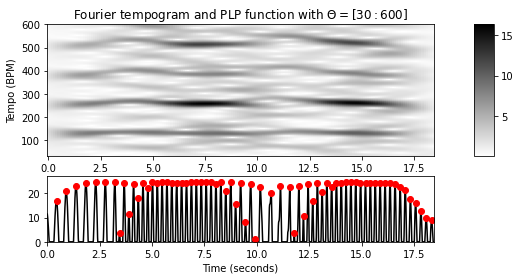

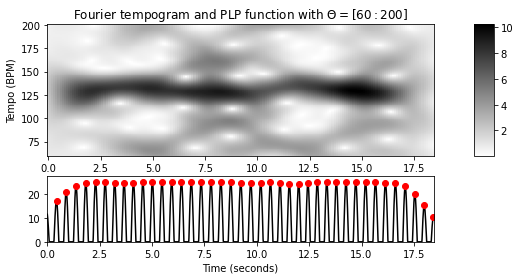

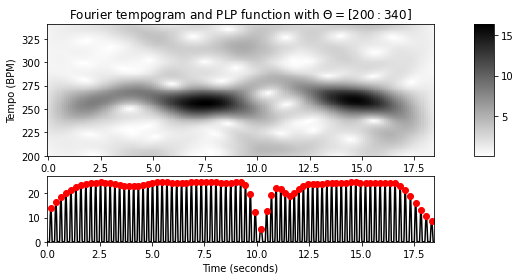

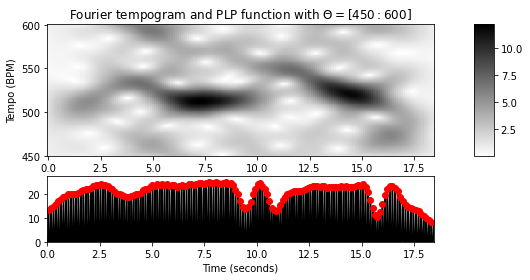

In [6]:
fn_wav = os.path.join('..', 'data', 'C6', 'FMP_C6_F20_Burgmueller_Op100-02-FirstPart.wav')

title=r'Fourier tempogram and PLP function with $\Theta=[30:600]$'
compute_plot_tempogram_plp(fn_wav, N=500, Theta=np.arange(30, 601), title=title)

title=r'Fourier tempogram and PLP function with $\Theta=[60:200]$'
compute_plot_tempogram_plp(fn_wav, N=500, Theta=np.arange(60,201), title=title)

title=r'Fourier tempogram and PLP function with $\Theta=[200:340]$'
compute_plot_tempogram_plp(fn_wav, N=500, Theta=np.arange(200,341), title=title)

title=r'Fourier tempogram and PLP function with $\Theta=[450:600]$'
compute_plot_tempogram_plp(fn_wav, N=500, Theta=np.arange(450,601), title=title)

## Further Notes

The detection of locally periodic patterns becomes challenging when the music recording reveals significant tempo changes. This often occurs in performances of classical music as a result of ritardandi, accelerandi, fermate, and so on. In particular, for highly expressive performances (e.g., interpretations of romantic piano music), the assumption of local quasiperiodicity is often violated, leading to poor beat tracking result (see, e.g., the article by <a href="https://www.audiolabs-erlangen.de/fau/professor/mueller/publications/2010_GroscheMuellerSapp_BeatError_ISMIR.pdf">Grosche et al. on "What makes beat tracking difficult?"</a>). Furthermore, the notions of tempo and beat are often vague and subjective, due to the complex hierarchical structure of rhythm. For example, there are [various levels](../C6/C6S2_TempoBeat.html) that contribute to the human perception of tempo and beat. The PLP concept introduced in this notebook does not explicitly address the problem of extracting pulses at a specific level. Instead, a **PLP function** can be regarded as a kind of **mid-level representation** that captures the locally predominant pulse.

<div class="alert" style="background-color:#F5F5F5; border-color:#C8C8C8">
<strong>Acknowledgment:</strong> This notebook was created by <a href="https://www.audiolabs-erlangen.de/fau/professor/mueller">Meinard Müller</a>.
</div> 

<table style="border:none">
<tr style="border:none">
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C0/C0.html"><img src="../data/C0_nav.png" style="height:50px" alt="C0"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C1/C1.html"><img src="../data/C1_nav.png" style="height:50px" alt="C1"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C2/C2.html"><img src="../data/C2_nav.png" style="height:50px" alt="C2"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C3/C3.html"><img src="../data/C3_nav.png" style="height:50px" alt="C3"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C4/C4.html"><img src="../data/C4_nav.png" style="height:50px" alt="C4"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C5/C5.html"><img src="../data/C5_nav.png" style="height:50px" alt="C5"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C6/C6.html"><img src="../data/C6_nav.png" style="height:50px" alt="C6"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C7/C7.html"><img src="../data/C7_nav.png" style="height:50px" alt="C7"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C8/C8.html"><img src="../data/C8_nav.png" style="height:50px" alt="C8"></a></td>
</tr>
</table>